Show how to open registered case files and check that everything looks right visually.

- **Date:** 2021-08-28
- **Author:** [Joni Juvonen](https://www.kaggle.com/qitvision)

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm.auto import tqdm
from matplotlib import animation, rc
rc('animation', html='jshtml')

In [2]:
reg_stack = np.load('../input/registered_cases/train/00000.npy')
seg = np.load('../input/registered_cases/train/00000_seg.npy')

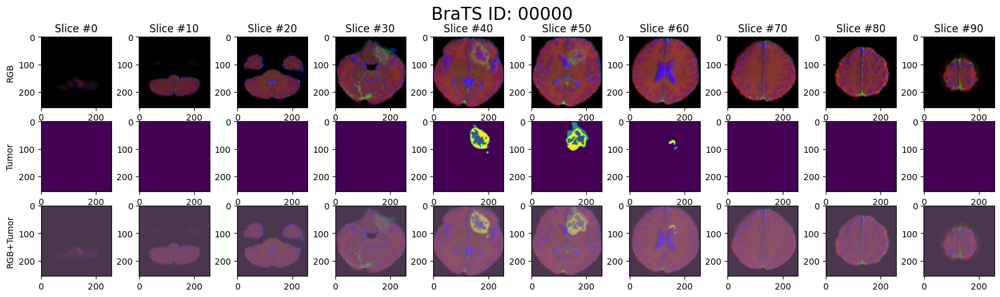

In [3]:
f, axs = plt.subplots(3,10, figsize=(20,5))

height_levels = reg_stack.shape[0]
for ind, j in enumerate(range(0, height_levels - 1, (height_levels//10))):
    if ind > 9:break
    axs[0,ind].imshow(reg_stack[j,:,:,:])
    
    axs[1, ind].imshow(seg[j,:,:])
    
    axs[2, ind].imshow(reg_stack[j,:,:,:], alpha=0.7)
    axs[2, ind].imshow(seg[j,:,:], alpha=0.3)
    axs[0,ind].set_title(f'Slice #{ind*(height_levels//10)}')

axs[0,0].set_ylabel('RGB')
axs[1,0].set_ylabel('Tumor')
axs[2,0].set_ylabel('RGB+Tumor')

plt.suptitle(f'BraTS ID: 00000', fontsize=20)
plt.show()

In [23]:
def highlight_slice(arr, seg_mask=None):
    if seg_mask is None:
        return arr
    
    highlight = arr.copy()
    highlight[:,:,1] = arr[:,:,1] + 0.5
    rgb_seg = np.stack([seg_mask,seg_mask,seg_mask], axis=2)
    new_arr = np.where(rgb_seg > 0, highlight, arr)
    new_arr = np.clip(new_arr, 0, 1.)
    return new_arr

def create_animation(ims):
    fig = plt.figure(figsize=(4, 4))
    plt.axis('off')
    plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    plt.tight_layout()
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

In [24]:
frames = [highlight_slice(reg_stack[i,:,:,:], seg[i,:,:]) for i in range(reg_stack.shape[0])]
create_animation(frames)

## Save animations to disk for visual check

In [15]:
train_path = '../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/'
train_dirs = os.listdir(train_path)

def maybe_create_dir(_dir):
    if not os.path.exists(_dir): os.mkdir(_dir)

train_save_dir = '../input/registered_train_animations/'
maybe_create_dir(train_save_dir)

In [45]:
for ind in tqdm(range(len(train_dirs))):
        
    fn = f'../input/registered_cases/train/{train_dirs[ind]}.npy'
    if not os.path.exists(fn):
        continue
    reg_stack = np.load(fn)
    seg_fn = f'../input/registered_cases/train/{train_dirs[ind]}_seg.npy'
    if os.path.exists(seg_fn):
        seg = np.load(seg_fn)
    else:
        seg = None
    if seg is None:
        frames = [highlight_slice(reg_stack[i,:,:,:], None) for i in range(reg_stack.shape[0])]
    else:
        frames = [highlight_slice(reg_stack[i,:,:,:], seg[i,:,:]) for i in range(reg_stack.shape[0])]
    anim = create_animation(frames)
    
    # Set up formatting for the movie files
    Writer = animation.writers['ffmpeg']
    writer = Writer(fps=25, metadata=dict(artist='qitvision'), bitrate=1800)
    
    anim.save(os.path.join(train_save_dir, f'{train_dirs[ind]}.mp4'), writer=writer)
    plt.close('all')

  0%|          | 0/585 [00:00<?, ?it/s]